In [1]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from utils import METRICS, CONT_PARAMETERS, LOG_PARAMETERS, SET_PARAMETERS, INT_PARAMETERS, read_narrow,\
    top_mean_dev_auc, top_mean_validation_auc, rolling_min_dev_auc, top_min_whole_validation_auc,\
    top_min_dev_auc, top_min_validation_auc

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
files = ['./experiments/narrow-whole-summary.pkl',
         './experiments/wide-whole-summary.pkl']

In [5]:
best_mean_dev = top_mean_dev_auc(read_narrow(files), 50000)
best_mean_dev.groupby(['file', 'experiment_id']).ngroups

116

In [6]:
best_min_dev = top_min_dev_auc(read_narrow(files), 50000)
best_min_dev.groupby(['file', 'experiment_id']).ngroups

118

In [7]:
true_best = top_min_whole_validation_auc(read_narrow(files), 50000)
true_best.groupby(['file', 'experiment_id']).ngroups

120

window = 11 works a bit better than 5, 21, 51, but difference is not really meaningful

In [8]:
rolling_min_dev = rolling_min_dev_auc(read_narrow(files), 50000, 11)
rolling_min_dev.groupby(['file', 'experiment_id']).ngroups

121

In [9]:
compare_columns = ['mean_dev_auc', 'mean_validation_auc',
               'mean_whole_validation_auc', 'min_dev_auc', 'min_validation_auc', 'min_whole_validation_auc']

In [10]:
best_mean_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.819711,0.002006,0.815645,0.818211,0.819704,0.821251,0.825328
mean_validation_auc,50000.0,0.800922,0.002709,0.789207,0.799170,0.801116,0.803192,0.805695
mean_whole_validation_auc,50000.0,0.799111,0.004947,0.776420,0.794158,0.800716,0.803349,0.806084
min_dev_auc,50000.0,0.805667,0.004214,0.776928,0.804473,0.806349,0.808353,0.813058
min_validation_auc,50000.0,0.795963,0.005300,0.769680,0.793042,0.797149,0.800829,0.804865
min_whole_validation_auc,50000.0,0.797104,0.005564,0.767050,0.793502,0.797472,0.801730,0.805814


In [11]:
best_mean_dev.min_whole_validation_auc.corr(best_mean_dev.mean_dev_auc, method='spearman')

0.5433148772050069

In [12]:
best_min_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.819455,0.002399,0.811270,0.818015,0.819695,0.821251,0.825328
mean_validation_auc,50000.0,0.800943,0.002571,0.791009,0.799020,0.801091,0.803180,0.805695
mean_whole_validation_auc,50000.0,0.798760,0.005541,0.773601,0.794344,0.800317,0.803349,0.806084
min_dev_auc,50000.0,0.806265,0.002841,0.799919,0.804588,0.806349,0.808353,0.813058
min_validation_auc,50000.0,0.796558,0.004481,0.776805,0.793502,0.797149,0.800829,0.804865
min_whole_validation_auc,50000.0,0.796741,0.006880,0.755603,0.793502,0.797472,0.801678,0.805814


In [13]:
best_mean_dev.min_whole_validation_auc.corr(best_min_dev.min_dev_auc, method='spearman')

0.5444281477843711

In [14]:
true_best[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.808292,0.038612,0.500000,0.815704,0.819113,0.821103,0.825328
mean_validation_auc,50000.0,0.790503,0.036659,0.500000,0.797864,0.800788,0.803191,0.805695
mean_whole_validation_auc,50000.0,0.800517,0.003494,0.793502,0.798591,0.801117,0.803397,0.808086
min_dev_auc,50000.0,0.786885,0.061563,0.500000,0.800729,0.805574,0.808317,0.813058
min_validation_auc,50000.0,0.778371,0.059812,0.500000,0.791811,0.797149,0.800829,0.804865
min_whole_validation_auc,50000.0,0.799031,0.003388,0.793502,0.797149,0.798936,0.801928,0.807405


In [15]:
rolling_min_dev[compare_columns + ['rolling_min_dev_auc']].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.819455,0.002396,0.811327,0.818016,0.819693,0.821251,0.825328
mean_validation_auc,50000.0,0.800948,0.002556,0.791009,0.799020,0.801078,0.803179,0.805695
mean_whole_validation_auc,50000.0,0.798806,0.005517,0.773601,0.794567,0.800367,0.803349,0.806084
min_dev_auc,50000.0,0.806222,0.002910,0.799394,0.804588,0.806349,0.808353,0.813058
min_validation_auc,50000.0,0.796548,0.004468,0.779577,0.793502,0.797149,0.800829,0.804865
min_whole_validation_auc,50000.0,0.796797,0.006838,0.755603,0.793502,0.797472,0.801632,0.805814
rolling_min_dev_auc,50000.0,0.806016,0.002975,0.799394,0.803901,0.806259,0.808248,0.813058


In [16]:
rolling_min_dev.min_whole_validation_auc.corr(rolling_min_dev.rolling_min_dev_auc, method='spearman')

0.6284912058893352

In [17]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

94

In [18]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(37869, 105)

In [19]:
rolling_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

97

In [20]:
rolling_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(38431, 106)

In [21]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

94

In [22]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(38128, 105)

In [23]:
best = rolling_min_dev

In [24]:
best.shape

(50000, 55)

In [25]:
best.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

count      mean       std  \
param_is_unbalance param_boost_from_average                                
False              False                     15340.0  0.793373  0.009268   
                   True                       1636.0  0.799864  0.002602   
True               False                     33024.0  0.798236  0.004751   

                                                  min       25%       50%  \
param_is_unbalance param_boost_from_average                                 
False              False                     0.755603  0.792484  0.794791   
                   True                      0.795114  0.797472  0.798916   
True               False                     0.775745  0.793638  0.798936   

                                                  75%       max  
param_is_unbalance param_boost_from_average                      
False              False                     0.798936  0.805814  
                   True                      0.801866  0.804923  
True               False                     0.802405  0.805175

In [29]:
best.groupby(SET_PARAMETERS + ['file', 'experiment_id']).size().groupby(SET_PARAMETERS).size()

param_is_unbalance  param_boost_from_average
False               False                       40
                    True                         4
True                False                       77
dtype: int64

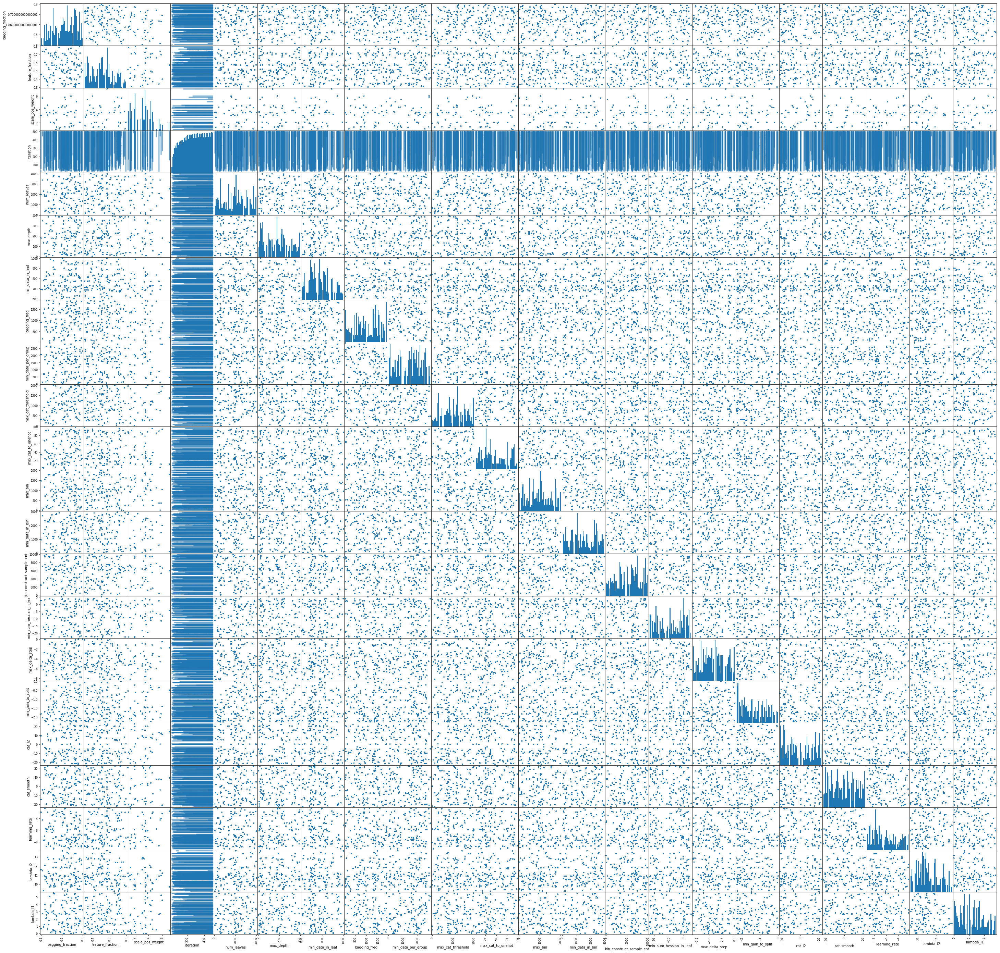

In [26]:
pd.plotting.scatter_matrix(
    pd.concat([best[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log(best[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=0.1, figsize=(50, 50), hist_kwds={'bins': 50});

### check failures in best selected parameter range

In [30]:
best_range = best\
    [[c for c in best.columns if c.startswith('param_') and not c in SET_PARAMETERS]]\
    .drop(columns=['param_seed'])\
    .quantile([0, 1]).T
best_range

,0.0,1.0
param_bagging_fraction,4.000851e-01,7.973027e-01
param_bagging_freq,6.300000e+01,1.896000e+03
param_bin_construct_sample_cnt,5.100000e+01,9.926000e+03
param_cat_l2,2.352933e-10,8.020231e+09
param_cat_smooth,1.734411e-10,4.267775e+09
param_feature_fraction,3.027052e-01,7.917457e-01
param_lambda_l1,1.001524e+00,2.457132e+02
param_lambda_l2,1.034415e+04,8.363299e+05
param_learning_rate,1.037219e-04,9.845313e-02
param_max_bin,1.000000e+01,2.016000e+03


In [42]:
dfs = []
for f in files:
    df = pd.read_pickle(f).assign(file=f)
    for (n, l, h) in best_range.itertuples():
        df = df[(((df[n] >= l) & (df[n] <= h))
                 | df[n].isna())].copy()
    dfs.append(df)

limited = pd.concat(dfs, ignore_index=True, sort=True)
del dfs
limited.shape

(1060000, 54)

In [44]:
limited_best_iteration = limited.sort_values('min_whole_validation_auc').groupby(['file', 'experiment_id']).last()
limited_best_iteration.shape

(2120, 52)

In [45]:
limited_best_iteration.min_whole_validation_auc.describe()

count    2120.000000
mean        0.601892
std         0.114844
min         0.500000
25%         0.500000
50%         0.500000
75%         0.718882
max         0.807405
Name: min_whole_validation_auc, dtype: float64

In [46]:
limited_bad = limited_best_iteration[limited_best_iteration.min_whole_validation_auc < 0.6]

In [47]:
limited_bad.shape

(1142, 52)

TODO pikachu with bruises reaction

In [51]:
limited_bad.groupby(SET_PARAMETERS).size()

param_is_unbalance  param_boost_from_average
False               False                       339
                    True                        351
True                False                       112
                    True                        340
dtype: int64

In [49]:
limited_best_iteration.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

count      mean       std  min  \
param_is_unbalance param_boost_from_average                                   
False              False                     712.0  0.614426  0.114379  0.5   
                   True                      423.0  0.535188  0.081170  0.5   
True               False                     548.0  0.687539  0.101704  0.5   
                   True                      437.0  0.538638  0.074894  0.5   

                                                 25%       50%       75%  \
param_is_unbalance param_boost_from_average                                
False              False                     0.50000  0.649691  0.723326   
                   True                      0.50000  0.500000  0.500000   
True               False                     0.66057  0.723181  0.746803   
                   True                      0.50000  0.500000  0.500000   

                                                  max  
param_is_unbalance param_boost_from_average            
False              False                     0.805814  
                   True                      0.807405  
True               False                     0.805175  
                   True                      0.782818

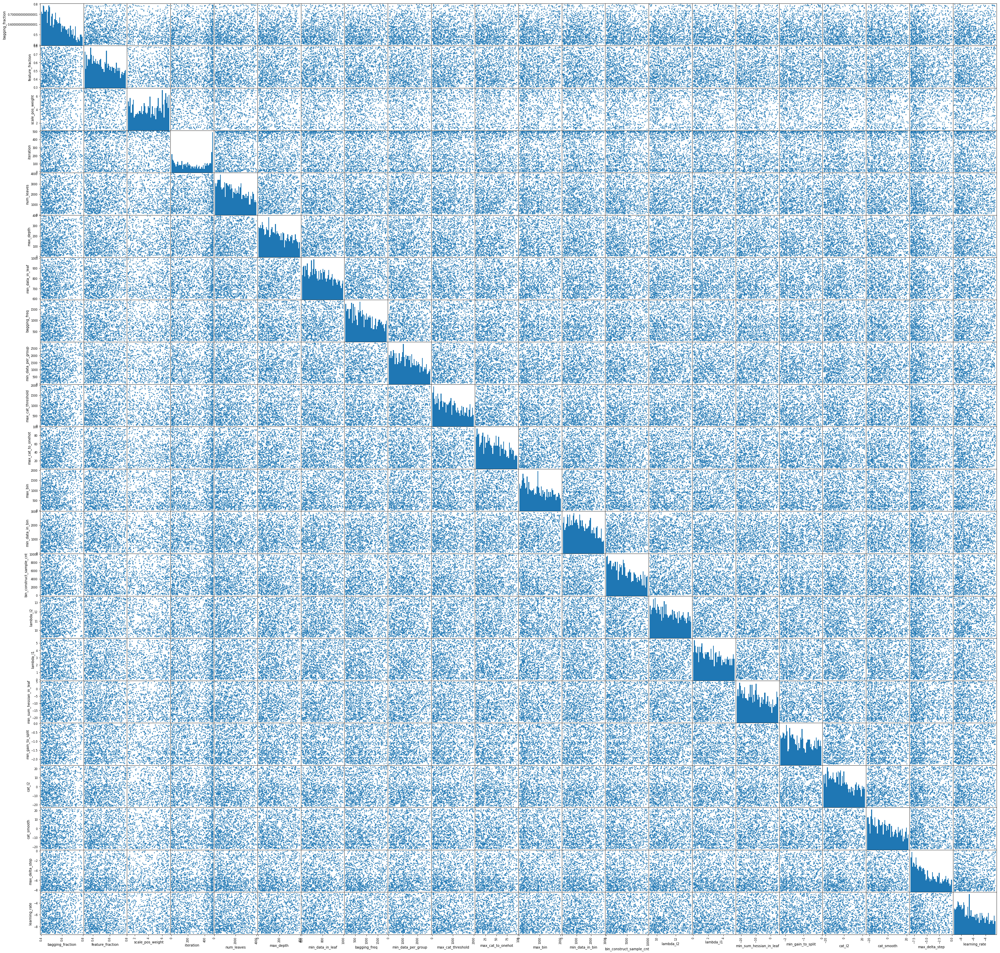

In [52]:
pd.plotting.scatter_matrix(
    pd.concat([limited_bad[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log(limited_bad[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=0.8, figsize=(50, 50), hist_kwds={'bins': 50});

### single best parameter set

In [34]:
single_best = best.iloc[0]

In [35]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(single_best)

experiment_id                                                             2907
file                                    ./experiments/narrow-whole-summary.pkl
iteration                                                                  261
max_dev_auc                                                           0.843567
max_dev_binary_logloss                                                0.693102
max_validation_auc                                                    0.805301
max_validation_binary_logloss                                         0.693108
max_whole_train_auc                                                   0.824419
max_whole_train_binary_logloss                                        0.693087
max_whole_validation_auc                                              0.805034
max_whole_validation_binary_logloss                                   0.693095
mean_dev_auc                                                          0.823389
mean_dev_binary_logloss                             

In [36]:
# todo generate 1% neighborhood around best parameter set

In [37]:
second_best = best.iloc[1]

In [38]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(second_best)

experiment_id                                                             2950
file                                    ./experiments/narrow-whole-summary.pkl
iteration                                                                  371
max_dev_auc                                                           0.843565
max_dev_binary_logloss                                                0.693131
max_validation_auc                                                    0.804095
max_validation_binary_logloss                                         0.693133
max_whole_train_auc                                                   0.822909
max_whole_train_binary_logloss                                        0.693125
max_whole_validation_auc                                              0.804095
max_whole_validation_binary_logloss                                   0.693128
mean_dev_auc                                                          0.822501
mean_dev_binary_logloss                             